# Instalación de dependencias.

*Recuerde elegir la GPU en el Runtime si no está ya seleccionada. Tiempo de ejecución --> Cambiar tipo de tiempo de ejecución --> Acelerador de hardware --> GPU*

In [ ]:
# Clonamos el repositorio de YOLOv5
!git clone https://github.com/ultralytics/yolov5  # comando para clonarlo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 16000, done.
remote: Counting objects: 100% (169/169), done.
remote: Compressing objects: 100% (100/100), done.
remote: Total 16000 (delta 104), reused 110 (delta 69), pack-reused 15831
Receiving objects: 100% (16000/16000), 14.64 MiB | 28.89 MiB/s, done.
Resolving deltas: 100% (10977/10977), done.
/content/yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [ ]:
# Instalamos las dependencias necesarias
!pip install -qr requirements.txt  # Instalar dependencias (ignoramos errores)
import torch

from IPython.display import Image, clear_output  # Mostrar imagenes
from utils.downloads import attempt_download  # Descargar modelos y conjunto de datos

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 20.2 MB/s eta 0:00:00
Setup complete. Using torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [ ]:
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5", api_key="bXlmA7bi4FsdwpTKHKCe")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.9/48.9 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.4 MB/s eta 0:00:00


In [ ]:
!pip install roboflow
from roboflow import Roboflow
project = rf.workspace().project("tfg_project_4")
dataset = project.version(39).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to TFG_Project_4-39 in yolov5pytorch:: 100%|██████████| 2356/2356 [00:00<00:00, 2574.24it/s]


In [ ]:
# este es el archivo YAML que Roboflow escribió para nosotros y que estamos cargando en este cuaderno con nuestros datos
%cat {dataset.location}/data.yaml

names:
- Escudo
- Inscripcion
nc: 2
roboflow:
  license: CC BY 4.0
  project: tfg_project_4
  url: https://universe.roboflow.com/tfg-guuhp/tfg_project_4/dataset/39
  version: 39
  workspace: tfg-guuhp
test: ../test/images
train: TFG_Project_4-39/train/images
val: TFG_Project_4-39/valid/images


# Definir la configuración y la arquitectura del modelo

Escribiremos un script yaml que defina los parámetros para nuestro modelo como el número de clases, anclas, y cada capa.

No es necesario que edite estas celdas, pero puede hacerlo.

In [ ]:
%cd "/content/yolov5"

# definir el número de clases basado en YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

/content/yolov5


In [ ]:
#esta es la configuración del modelo que usaremos.
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
#Personalizamos el archivo iPython para poder escribir variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parametros
nc: {num_classes}  # numeroo de clases
depth_multiple: 0.33  # modelo profundidad múltiple
width_multiple: 0.50  # canal de capa múltiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# Backbone de YOLOv5
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# Cabeza de YOLOv5
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Detector personalizado de YOLOv5

### A continuación, iniciamos el entrenamiento.


Aquí podemos pasar varios argumentos:
- **img:** definir el tamaño de la imagen de entrada
- **batch:** determinar el tamaño del lote
- **epochs:** define el número de épocas de entrenamiento. (Nota: a menudo, 3000+ son comunes aquí).
- **data:** establecer la ruta a nuestro archivo yaml
- **cfg:** especificar la configuración de nuestro modelo
- **weights:** especifique una ruta personalizada para los pesos.
- **name:** nombres resultantes
- **nosave:** guardar sólo el punto de control final
- **cache:** imágenes en caché para un entrenamiento más rápido

In [ ]:

# cronometramos su rendimiento
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch-size -1 --weights yolov5s.pt --epochs 300 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml  --name yolov5s_results


# Evaluar el rendimiento del detector personalizado YOLOv5

Las pérdidas de entrenamiento y las métricas de rendimiento se guardan en Tensorboard y también en un archivo de registro definido anteriormente con el flag **--name** cuando entrenamos. En nuestro caso, lo llamamos `yolov5s_results`. (Si no se le da un nombre, por defecto es `results.txt`.) El archivo de resultados se representa como un png después de completar el entrenamiento.

Nota de Glenn: Los archivos `results.txt` parcialmente completados pueden ser puestos en un gráfico con `from utils.utils import plot_results; plot_results()`.

In [ ]:
# Iniciar TensorBoard

# Lanzamos después de haber empezado a entrenar
# los registros se guardan en la carpeta "runs"
%reload_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#Prueba de validación con el conjunto de validacion
!python val.py --weights runs/train/yolov5s_results/weights/best.pt --data {dataset.location}/data.yaml --img 416 --workers 0 --save-txt --conf-thres 0.6 --task val

### ¿Tienes curiosidad? Visualice nuestros datos de formación con etiquetas

Una vez iniciado el entrenamiento, visualice las imágenes `train*.jpg` para ver las imágenes de entrenamiento, las etiquetas y los efectos de aumento.

Observe que se utiliza un cargador de datos en mosaico para el entrenamiento (mostrado abajo), un nuevo concepto de cargador de datos desarrollado por Glenn Jocher y presentado por primera vez en [YOLOv4](https://arxiv.org/abs/2004.10934).

In [ ]:
#  mostramos nuestros datos reales
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Ejecutamos la inferencia con ponderaciones entrenadas
Ejecutamos la inferencia con un punto de control pre-entrenado sobre el contenido de la carpeta `test/images` descargada de Roboflow.

Nota: Para poder utilizar los pesos entrenados sin entrenar previamente la red, tendremos que crear la carpeta `yolov5_results`, guardada en el mismo repositorio de GitHub que este mismo Colab, de la siguiente forma:



1.   Dentro de la carpeta `yolov5`:


*   Creamos una carpeta llamada `runs`.
*   Dentro de `runs` creamos otra carpeta llamada `train`.
*   Dentro de la carpeta `train`creamos otra carpeta llamada `yolov5_results`.
*   Dentro de la carpeta `yolov5s_results` creamos una carpeta llamada `weights`, y subimos los archivos `events.out.tfevents.1684140138.8ad1451f6b6a.991.0`, `hyp.yaml`y `opt.yaml`, también guardadas en el GitHub, en la carpeta `yolov5s_results`.
* Por último, dentro de la carpeta `weights`, subimos los archivos `best.pt`y `last.pt`.







In [ ]:
# los pesos entrenados se guardan por defecto en nuestra carpeta de pesos
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt


Nota: Tenemos que hacer una pequeña modificación en el archivo `detect.py`, ubicado en la carpeta `yolov5`, de la siguiente manera:

* La línea 226, (`parser.add_argument('--save-txt', action='store_true', help='save results to *.txt'`))
debems sustituirla por `parser.add_argument('--save-txt', default=True, action='store_true', help='save results to *.txt')`

De esta forma, guardamos las detecciones en una serie de archivos `.txt`, que se utilizarán posteriormente en las operaciones de postproceso.


In [ ]:
# Cuando ejecutamos esto, se ven 0,007 segundos de tiempo de inferencia.
# Usamos los mejores pesos
%cd /content/yolov5/

!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.5  --source /content/yolov5/TFG_Project_4-39/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/TFG_Project_4-39/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
image 1/95 /content/yolov5/TFG_Project_4-39/test/images/Img_106I_jpg.rf.f9929775fd5db1a28e2e5e19fd1c5db7.jpg: 416x416 1 Inscripcion, Done. (0.008s)
image 2/95 /content/yolov5/TFG_Project_4-39/test/images/Img_109I_jpg.rf.cb17e0e6f9cfe389c86bea719d328f77.jpg: 416x416 1 Inscripcion, Done. (0.013s)
image 3/95 /content/y

In [ ]:
import cv2
import math
import os
import string
import matplotlib.pyplot as plt
import numpy as np
import glob


from google.colab.patches import cv2_imshow
from PIL import Image
from skimage.metrics import structural_similarity
from skimage import io
from skimage.io import imread, imshow
from skimage.color import rgb2hsv, rgb2gray, rgb2yuv
from skimage import color, exposure, transform
from skimage.exposure import equalize_hist
from skimage import measure, morphology
from skimage.measure import regionprops
from IPython.display import Image, display

In [ ]:
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def distance(x1, y1, x2, y2):
  return math.sqrt((x1 - x2)**2 + (y1 - y2)**2)

In [ ]:
def CalcularDistancia(Esquinas):
  container_rect = None

  # Calculamos el centroide de cada rectángulo
  centers = []
  for rect in Esquinas:
    x = (rect[1][0] + rect[2][0] + rect[3][0] + rect[4][0]) / 4
    y = (rect[1][1] + rect[2][1] + rect[3][1] + rect[4][1]) / 4
    centers.append((x, y))

  # Calculamos la distancia mínima entre los rectángulos
  min_dist = float("inf")
  for i in range(len(Esquinas)):
    for j in range(i + 1, len(Esquinas)):
      if ((Esquinas[i][0] == 0 and Esquinas[j][0] == 1) or (Esquinas[i][0] == 1 and Esquinas[j][0] == 1)
      or ((Esquinas[i][0] == 1 and Esquinas[j][0] == 0))):

        dist = distance(centers[i][0], centers[i][1], centers[j][0], centers[j][1])
        if dist != 0 and dist < min_dist and (Esquinas[i][0] != Esquinas[j][0] or Esquinas[i][0] == Esquinas[j][0] == 1):
          min_dist = dist
         # Calculamos las coordenadas del rectángulo que contenga a ambos rectángulos
          left = min(Esquinas[i][1][0], Esquinas[i][2][0], Esquinas[i][3][0], Esquinas[i][4][0],
                   Esquinas[j][1][0], Esquinas[j][2][0], Esquinas[j][3][0], Esquinas[j][4][0])
          right = max(Esquinas[i][1][0], Esquinas[i][2][0], Esquinas[i][3][0], Esquinas[i][4][0],
                    Esquinas[j][1][0], Esquinas[j][2][0], Esquinas[j][3][0], Esquinas[j][4][0])
          top = min(Esquinas[i][1][1], Esquinas[i][2][1], Esquinas[i][3][1], Esquinas[i][4][1],
                Esquinas[j][1][1], Esquinas[j][2][1], Esquinas[j][3][1], Esquinas[j][4][1])
          bottom = max(Esquinas[i][1][1], Esquinas[i][2][1], Esquinas[i][3][1], Esquinas[i][4][1],
                Esquinas[j][1][1], Esquinas[j][2][1], Esquinas[j][3][1], Esquinas[j][4][1])

# Calculamos las coordenadas de las esquinas del rectángulo que contiene a los rectángulos contenidos
      container_rect = [(left, top), (left, bottom), (right, bottom), (right, top)]
  return container_rect

In [ ]:
def PintaRectangulo(RectanguloGrande, nombre, titulo):
  directorioImagen = "/content/yolov5/runs/detect/exp/"+nombre
  img = cv2.imread(directorioImagen)
  cv2.rectangle(img, (RectanguloGrande[0][0],RectanguloGrande[0][1]),
                      (RectanguloGrande[2][0],RectanguloGrande[2][1]), (255,0,0), 3)

  cv2_imshow(img)
  cv2.waitKey(0)

In [ ]:
def ExtraeRectangulos(Esquinas, nombre, contador):
  directorioImagen = "/content/yolov5/runs/detect/exp/"+nombre
  img = cv2.imread(directorioImagen)
  for rectangulo in Esquinas:
    recorte = img[rectangulo[1][1]:rectangulo[4][1], rectangulo[1][0]:rectangulo[4][0]]
    if (rectangulo[0] == 1): #Inscripcion
      plt.title('Imagen original')
      plt.imshow(recorte)
      plt.show()
      #Convertimos la imagen a escala de grises y hacemos un umbralizado gaussiano
      gray_image = cv2.cvtColor(recorte, cv2.COLOR_RGB2GRAY)
      img_umbr1 = cv2.adaptiveThreshold(gray_image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,21,10)

      plt.title('Imagen umbralizada')
      plt.imshow(img_umbr1, cmap='Greys')
      plt.show()
      #extrae las regiones negras
      blobs = img_umbr1 < img_umbr1.mean()

      plt.title('Imagen blobs')
      plt.imshow(blobs, cmap='Greys')
      plt.show()

  #PROCESO 2 # borrar componentes conexas de tamaño menor que la media de los componentes de la
  #imagen
      total_area = 0
      counter = 0
      average = 0.0
      blobs_labels = measure.label(blobs, background=0)
      for region in regionprops(blobs_labels):
        total_area = total_area + region.area
        counter = counter + 1
      average = (total_area/counter)
      pre_version = morphology.remove_small_objects(blobs_labels, average)

      plt.title('Componentes extraidas')
      plt.imshow(pre_version, cmap='Greys')
      plt.show()

      #Binarizamos la imagen
      im_bin = (pre_version > 0) * 255
      plt.title('Imagen umbralizada de componentes extraidas')
      plt.imshow(im_bin, cmap='Greys')
      plt.show()


    if (rectangulo[0] == 0): #Escudo
    #Guardamos el recorte
      %cd "/content/yolov5/TFG_Project_4-39/test/RecortesEscudos"
      cv2.imwrite("/content/yolov5/TFG_Project_4-39/test/RecortesEscudos/Recorte"+str(contador)+".jpg", recorte)
      print("")


In [ ]:
def GetEsquinas(lineas):
  esquinas = []
  constante = 416
  for linea in lineas:
    rectangulo = []
    valores = linea.split()

    # Clase
    rectangulo.append(int(valores[0]))

    # X e Y de la esquina superior izquierda
    x1 = int(constante * float(valores[1]) - constante * float(valores[3]) / 2)
    y1 = int(constante * float(valores[2]) - constante * float(valores[4]) / 2)
    rectangulo.append([x1, y1])

    # X e Y de la esquina superior derecha
    x2 = int(constante * float(valores[1]) + constante * float(valores[3]) / 2)
    y2 = y1
    rectangulo.append([x2, y2])

    # X e Y de la esquina inferior izquierda
    x3 = x1
    y3 = int(constante * float(valores[2]) + constante * float(valores[4]) / 2)
    rectangulo.append([x3, y3])

    # X e Y de la esquina inferior derecha
    x4 = x2
    y4 = y3
    rectangulo.append([x4, y4])

    esquinas.append(rectangulo)

  return esquinas

In [ ]:

# Ruta del directorio que contiene los archivos de texto
directorio = "/content/yolov5/runs/detect/exp/labels"

%cd "/content/yolov5/TFG_Project_4-39/test"

#Escudos

%rm -r "RecortesEscudos"
%mkdir "RecortesEscudos"

contador = 0
# Obtenemos la lista de archivos en el directorio
archivos = os.listdir(directorio)
# Iteramos sobre la lista de archivos
for archivo in archivos:

  # Abro el archivo en modo lectura
  with open(os.path.join(directorio, archivo), "r") as f:

    # Obtengo la lista de líneas del archivo
    lineas = f.readlines()

    #Guardamos la clase de la deteccion
    clase = []
    for linea in lineas:
      clase.append(linea[0])

    #Extraemos las esquinas del rectangulo de la deteccion
    Esquinas = GetEsquinas(lineas)

    #Guardamos el nombre de la imagen
    nombreImagen = archivo.replace(".txt", ".jpg")

    #Si hay algún escudo o alguna inscripcion
    if (clase.count("0") > 0 or (clase.count("1") > 0)):

      # extrae la region y la muestra
      ExtraeRectangulos(Esquinas, nombreImagen, contador)
      contador += 1

    #Si hay al menos una inscripcion y un escudo o dos inscripciones
    if (((clase.count("1") > 0) and (clase.count("0") > 0)) or (clase.count("1") >= 2)):

      #Comprobamos si están lo suficientemente cerca para que sean inscripción con escudo
      RectanguloGrande = CalcularDistancia(Esquinas)

      #Pintamos el rectangulo
      PintaRectangulo(RectanguloGrande, nombreImagen, "")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def DetectorPuntosInteres(archivos):
# se crea un detector SIFT
  sift = cv2.SIFT_create()
  bf = cv2.BFMatcher()

  # Iteramos sobre la lista de archivos
  for archivo in archivos:
    escudo1 = cv2.imread(archivo, 0)
    escudo1 = cv2.resize(escudo1, (416, 416))

    for archivo2 in archivos:
      escudo2 = cv2.imread(archivo2, 0)
      escudo2 = cv2.resize(escudo2, (416, 416))

      # se localizan los puntos de interés y sus descriptores en ambas imágenes
      keypoints_1, descriptors_1 = sift.detectAndCompute(escudo1, None)
      keypoints_2, descriptors_2 = sift.detectAndCompute(escudo2, None)


      if ((len(keypoints_1) > 1) and (len(keypoints_2) > 0)):
        # Emparejado de puntos por fuerza bruta: Brute Force matcher
        #Se escoge un descriptor de primer conjunto y trata de emparejarlo con todos los del segundo conjunto
        #usando un algoritmo de distancias (knn), Así sucesivamente empareja todos los puntos
        matches = bf.knnMatch(descriptors_1,descriptors_2, k=2)


        #Aplica un test de relaciones (ratios) entre puntos para dibujarlos mejor
        # 'distance' menor significa que los descriptores son mejores
        good = [[m] for m,n in matches if m.distance <= 0.75*n.distance]

        img3 = cv2.drawMatchesKnn(escudo1,keypoints_1,escudo2,keypoints_2,good,None,flags=2)
        plt.subplot(1,1,1)
        plt.title('Imagen 1')
        io.imshow(img3)
        io.show()
        print("Puntos de inetres del escudo 1:",len(keypoints_1))
        print("Puntos de interes del escudo 2:",len(keypoints_2))
        print("puntos de interes comunes a ambos escudos =", len(good))

In [ ]:
# Calcular la diferencia de imágenes
def DiferenciaImagenes(archivos):
  # Iteramos sobre la lista de archivos
  for archivo in archivos:
    escudo1 = cv2.imread(archivo, 0)
    escudo1 = cv2.resize(escudo1, (416, 416))

    for archivo2 in archivos:
      escudo2 = cv2.imread(archivo2, 0)
      escudo2 = cv2.resize(escudo2, (416, 416))
      # Calcular la diferencia de imágenes
      diff = cv2.absdiff(escudo1, escudo2)

      # Mostrar la imagen de diferencia
      plt.subplot(1,1,1)
      plt.title('Imagen de diferencia')
      io.imshow(diff)
      io.show()


In [ ]:
def CorrelacionImagenes(archivos):
    # Iteramos sobre la lista de archivos
  for archivo in archivos:
    escudo1 = cv2.imread(archivo, 0)
    escudo1 = cv2.resize(escudo1, (416, 416))

    for archivo2 in archivos:
      escudo2 = cv2.imread(archivo2, 0)
      escudo2 = cv2.resize(escudo2, (416, 416))
      # Calcular la medida de correlación
      result = cv2.matchTemplate(escudo1, escudo2, cv2.TM_CCOEFF_NORMED)

      plt.subplot(1,2,1)
      plt.title('Imagen 1')
      io.imshow(escudo1)

      plt.subplot(1,2,2)
      plt.title('Imagen 2')
      io.imshow(escudo2)
      io.show()
      # Obtener la posición de la medida de correlación máxima

      min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

      # Mostrar la medida de correlación
      print('La medida de correlacion es:', max_val)

In [ ]:

def Similaridad(archivos):
   # Iteramos sobre la lista de archivos
  for archivo in archivos:
    escudo1 = cv2.imread(archivo, 0)
    escudo1 = cv2.resize(escudo1, (416, 416))
    for archivo2 in archivos:
      escudo2 = cv2.imread(archivo2, 0)
      escudo2 = cv2.resize(escudo2, (416, 416))

      plt.subplot(1,2,1)
      plt.title('Imagen 1')
      io.imshow(escudo1)

      plt.subplot(1,2,2)
      plt.title('Imagen 2')
      io.imshow(escudo2)
      io.show()

      #SSN
      ssim = structural_similarity(escudo1, escudo2, multichannel=True)
      print("Indice de similaridad estructural :", ssim)


/content/yolov5/TFG_Project_4-39/test/RecortesEscudos


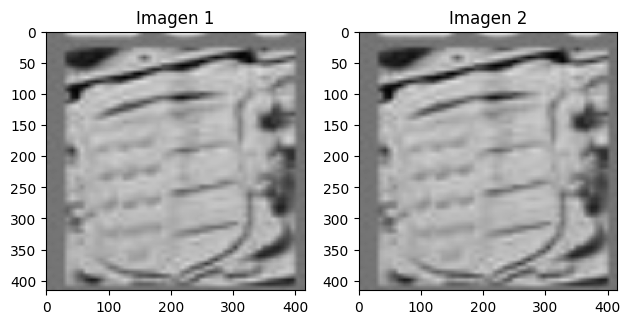

La medida de correlacion es: 1.0


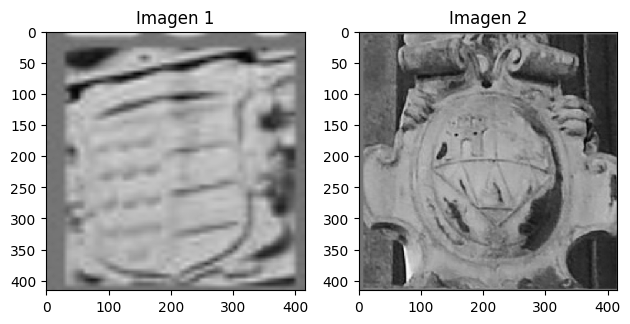

La medida de correlacion es: 0.16705340147018433


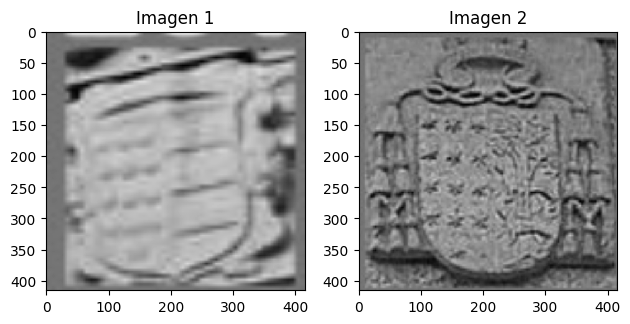

La medida de correlacion es: 0.08861981332302094


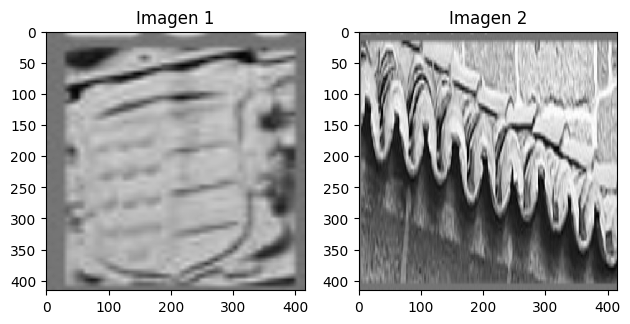

La medida de correlacion es: -0.11467168480157852


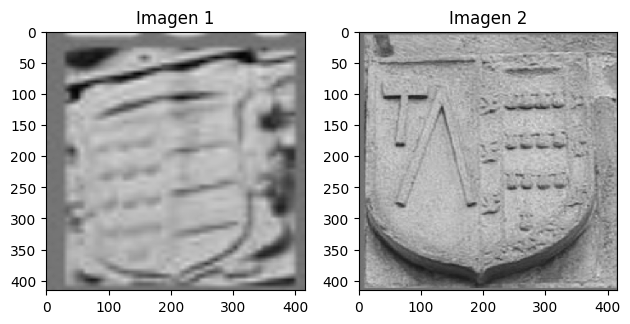

La medida de correlacion es: 0.17545853555202484


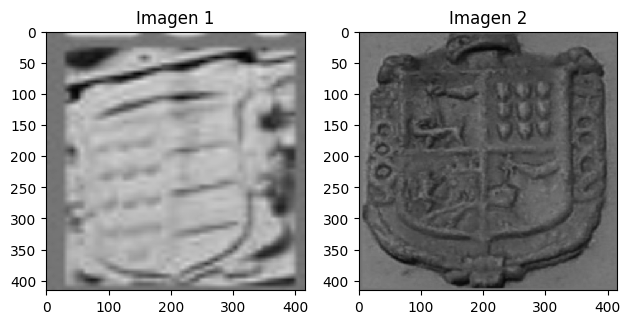

La medida de correlacion es: -0.17138107120990753


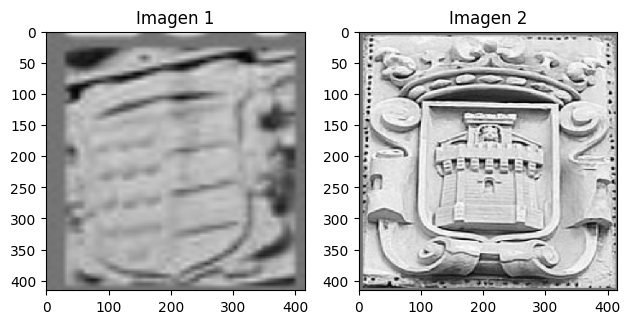

La medida de correlacion es: 0.018871473148465157


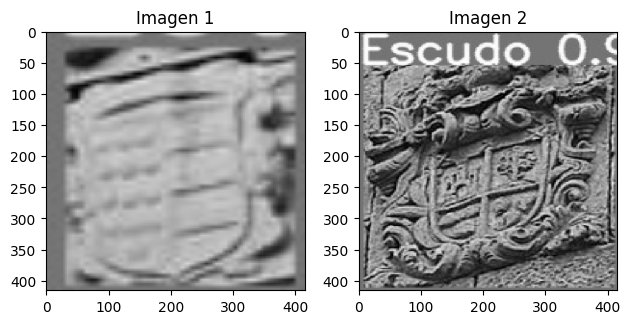

La medida de correlacion es: -0.1304553747177124


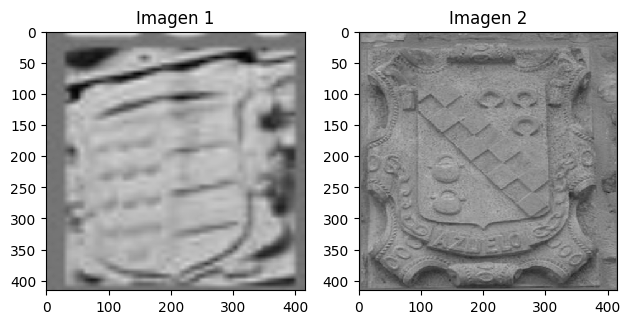

La medida de correlacion es: 0.24206353724002838


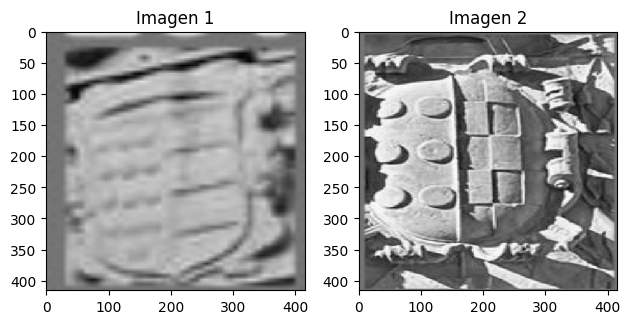

La medida de correlacion es: 0.19152751564979553


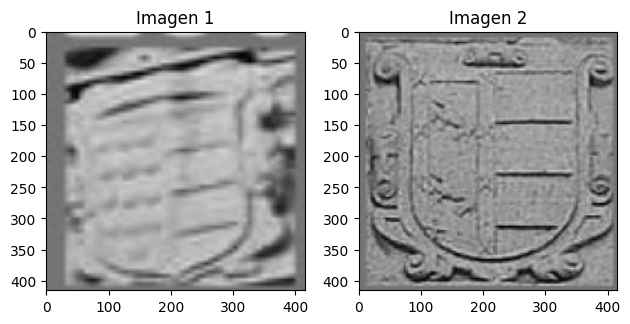

La medida de correlacion es: 0.13154320418834686


KeyboardInterrupt: ignored

In [ ]:

#Detectar puntos de interes en los escudos
%cd "/content/yolov5/TFG_Project_4-39/test/RecortesEscudos"
DirectorioEscudos = "/content/yolov5/TFG_Project_4-39/test/RecortesEscudos"

# Obtenemos la lista de archivos en el directorio
archivos = os.listdir(DirectorioEscudos)

#Detector de puntos de interes
#DetectorPuntosInteres(archivos)

#Diferencia de imagenes
#DiferenciaImagenes(archivos)

#Correlacion de imagenes
CorrelacionImagenes(archivos)

#Similaridad estructural
#Similaridad(archivos)
